In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mplt
import seaborn as sns
import arviz as az
import datetime

In [2]:
import fit_arima

In [3]:
import open_data
df_temp = open_data.open()
df = df_temp[0]

In [4]:
ritorno = fit_arima.compute(2, 1, catene=4, samples_per_chain=2500, burnin=1000)

19:07:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

19:29:26 - cmdstanpy - INFO - CmdStan done processing.
19:29:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Scale parameter is 0, but must be positive! (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/Spatial/code.stan', line 177, column 4 to column 34)
	Exception: normal_lpdf: Scale parameter is 0, but must be positive! (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/Spatial/code.stan', line 177, column 4 to column 34)
	Exception: normal_lpdf: Scale parameter is 0, but must be positive! (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/Spatial/code.stan', line 177, column 4 to column 34)
	Exception: code_model_namespace::log_prob: phi[1][1] is -nan, but must be greater than or equal to -1.000000 (in '/home/br1/PythonProjects/PythonStats/git_bayesian_copie/ARIMA/Spatial/code.stan', line 101, column 2 to column 47)
Exception: code_model_namespace::log_prob: H is not symmetric. H[1,2] = inf, but H[

/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/Spatial/fit_arima.py:43: FutureWarning: Indexing with a float is deprecated, and will raise an IndexError in pandas 2.0. You can manually convert to an integer key instead.
  y_missing_list.append({'Stazione':df.columns[v[i]],'Data':df.index[u[i]],'Samples':inference_data.posterior.w.values[:,:,i].reshape(catene*samples_per_chain)})


Tempo di computazione: 22:02

In [5]:
res = az.loo(ritorno['inference_data'], var_name="log_lik", pointwise=True)
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Computed from 10000 posterior samples and 17191 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  7249.97   154.92
p_loo      287.49        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     17091   99.4%
 (0.5, 0.7]   (ok)          86    0.5%
   (0.7, 1]   (bad)         14    0.1%
   (1, Inf)   (very bad)     0    0.0%

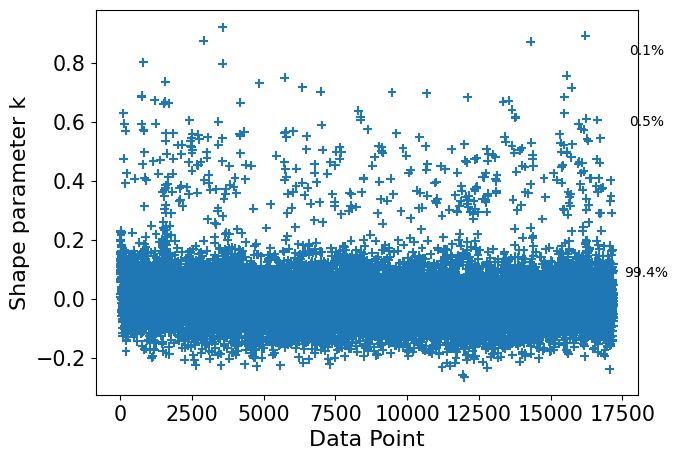

In [6]:
aux_plt = az.plot_khat(res, show_bins=True, figsize=(7,5))

In [7]:
res = az.waic(ritorno['inference_data'], var_name="log_lik")
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 10000 posterior samples and 17191 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  7262.00   154.79
p_waic      275.45        -

There has been a warning during the calculation. Please check the results.

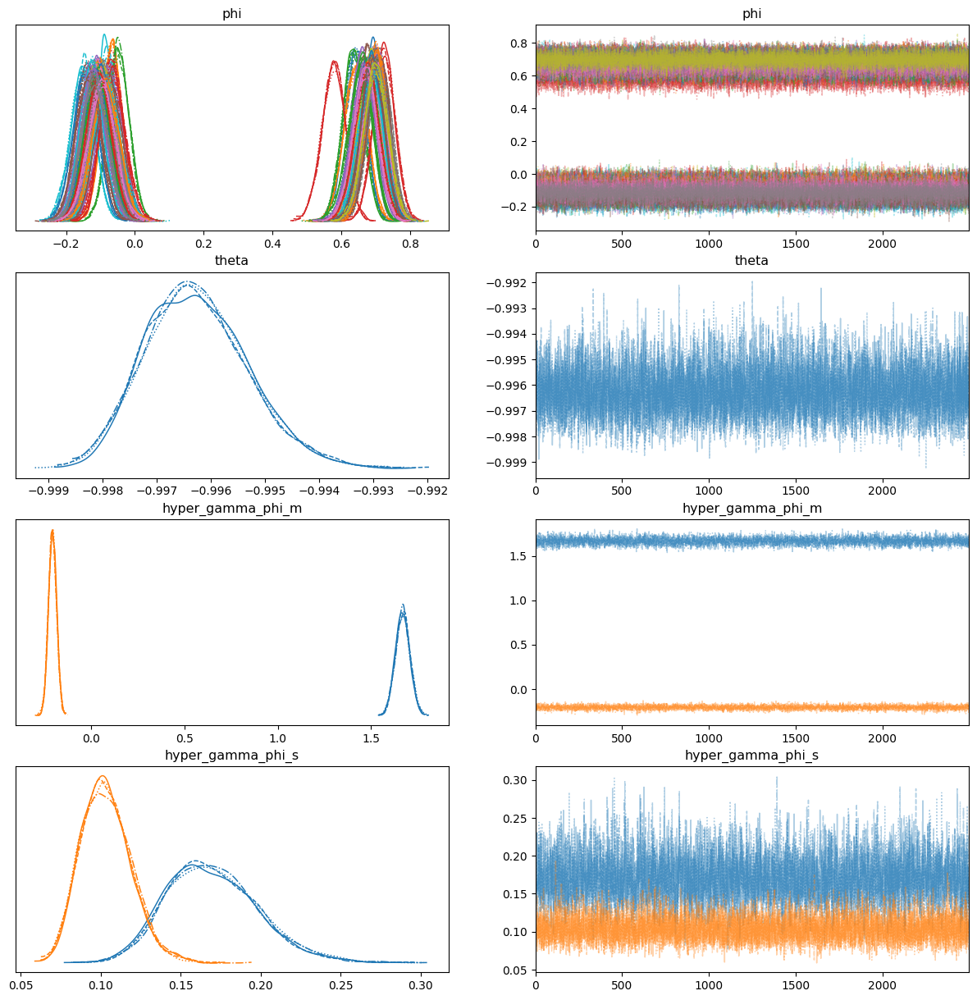

In [8]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['phi','theta','hyper_gamma_phi_m','hyper_gamma_phi_s'], divergences=True, figsize=(15,15))

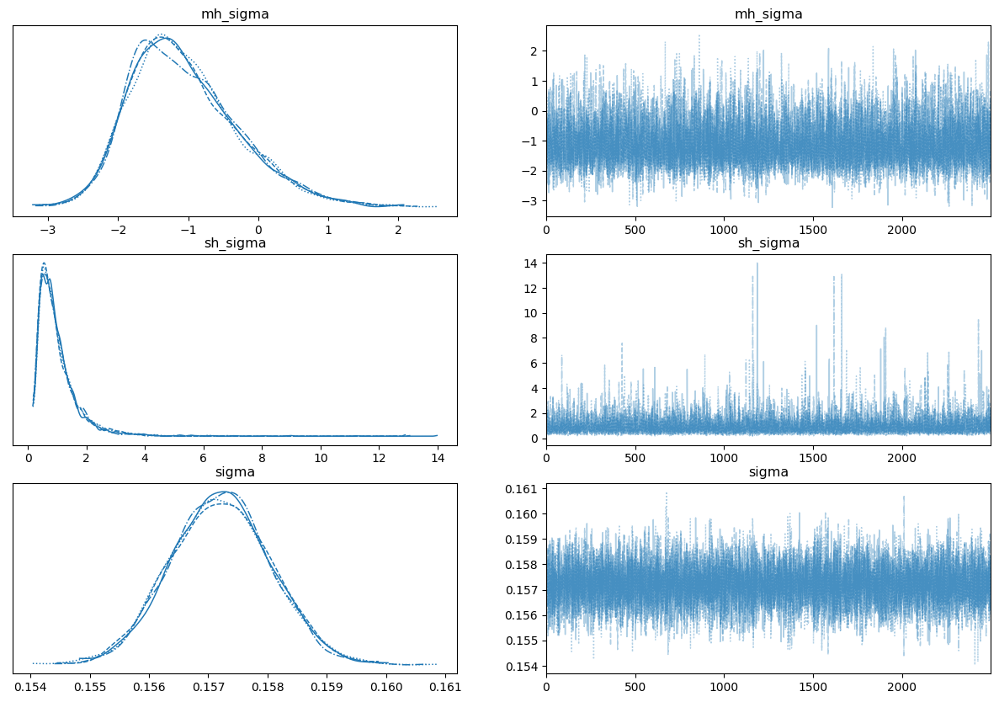

In [9]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['mh_sigma','sh_sigma','sigma'], divergences=True, figsize=(15,10))

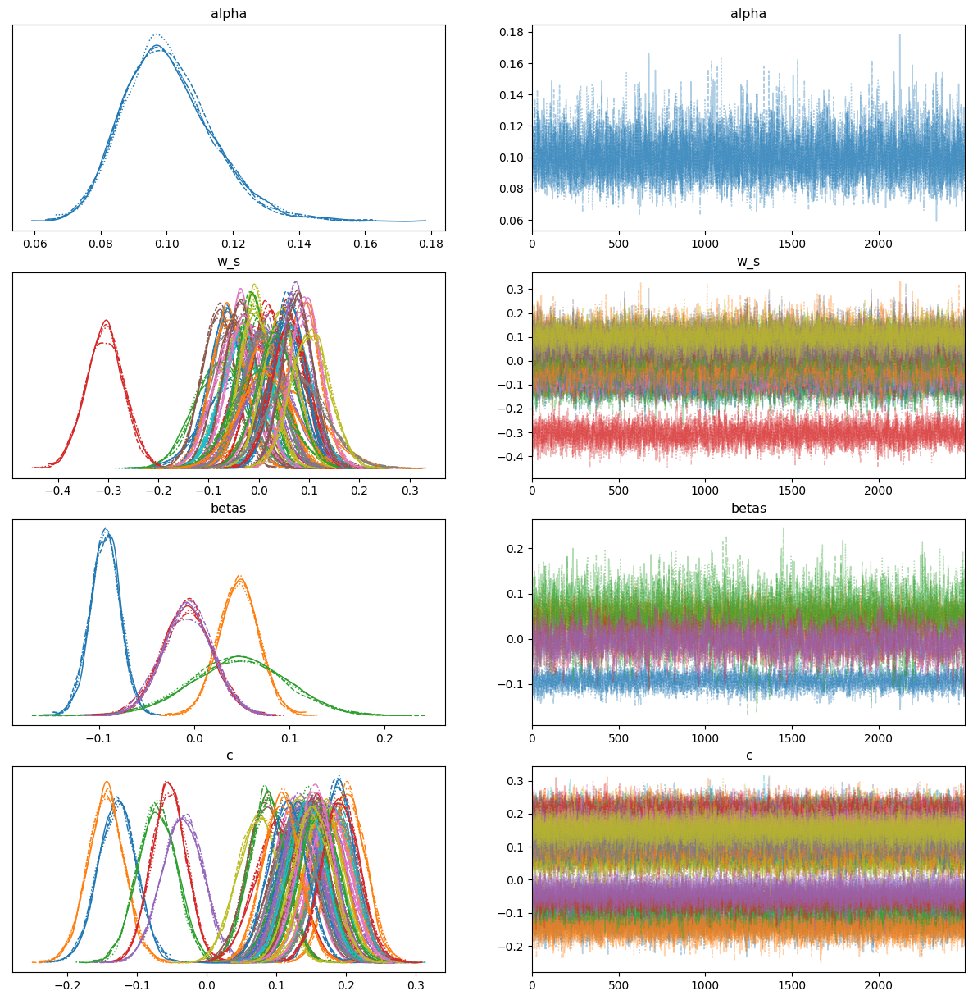

In [10]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['alpha','w_s','betas','c'], divergences=True, figsize=(15,15))

In [11]:
df_risultati = az.summary(ritorno['inference_data'], var_names=['betas'], hdi_prob=0.95)
df_risultati.loc[:,'Name'] = ['Altitude','Type_Suburban','Type_Rural','Zoning_2','Zoning_3'] #????????? Come sono state fatte le covariate?
df_risultati.set_index('Name', inplace=True)
df_risultati

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Name,,,,,,,,,
Altitude,-0.093,0.016,-0.126,-0.063,0.000,0.000,3364.0,4784.0,1.0
Type_Suburban,0.047,0.021,0.005,0.089,0.000,0.000,7476.0,7287.0,1.0
Type_Rural,0.047,0.050,-0.051,0.144,0.001,0.001,2872.0,4449.0,1.0
Zoning_2,-0.007,0.027,-0.058,0.046,0.001,0.001,948.0,2215.0,1.0
Zoning_3,-0.007,0.027,-0.060,0.045,0.001,0.001,1009.0,2075.0,1.0


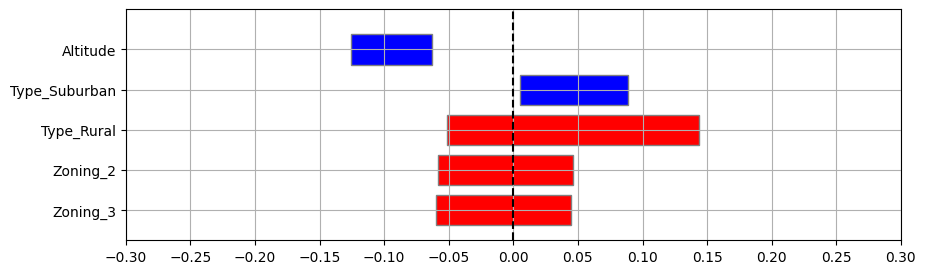

In [12]:
import time
from matplotlib.patches import Rectangle

plt.figure(figsize=(10,3))
ax = plt.subplot(1,1,1)
plt.xlim(left = -0.3, right = 0.3)
pos_rows = np.arange(0,len(df_risultati.index))
plt.ylim(bottom=-0.75, top=pos_rows[-1]+1.0)
i = 1
for row in df_risultati.index:    
    lci = df_risultati.loc[row, 'hdi_2.5%']
    rci = df_risultati.loc[row, 'hdi_97.5%']
    len_ci = rci - lci
    if lci*rci <= 0:
        col = 'red'
    else:
        col = 'blue'
    ax.add_patch(Rectangle((lci, pos_rows[-i] - 0.75/2), len_ci, 0.75,
             edgecolor = 'grey',
             facecolor = col,
             fill=True,
             lw=1))
    i += 1
    
    
plt.axvline(0, 0, pos_rows[-1]+0.75, linestyle='--', color='black')
plt.grid(axis='both')
plt.yticks(ticks=np.flip(pos_rows), labels=df_risultati.index.to_list())
plt.xticks(ticks=np.linspace(-0.3,0.3,13))
plt.show()

<AxesSubplot: ylabel='Density'>

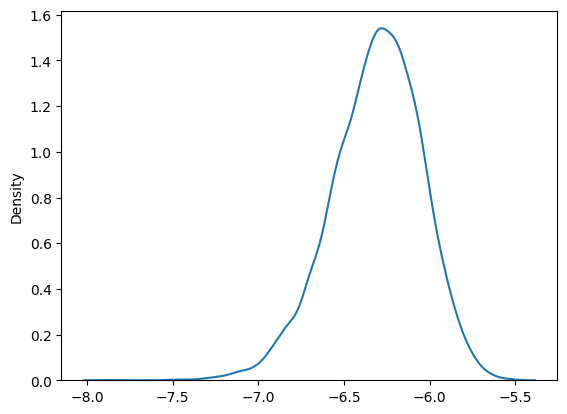

In [13]:
aux_shape = ritorno['inference_data'].posterior.gamma_th.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.gamma_th.values.reshape((aux_shape[0]*aux_shape[1])), legend=False)

<AxesSubplot: ylabel='Density'>

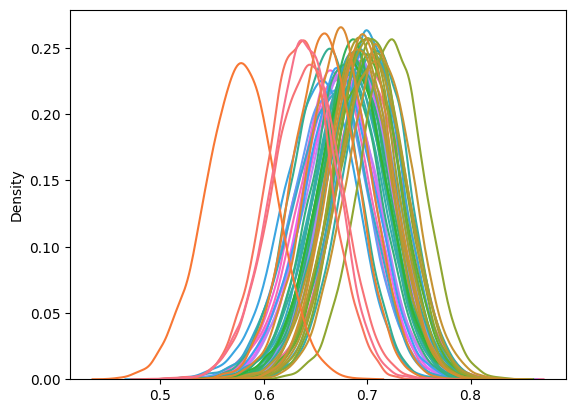

In [14]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,0,:], legend=False)

<AxesSubplot: ylabel='Density'>

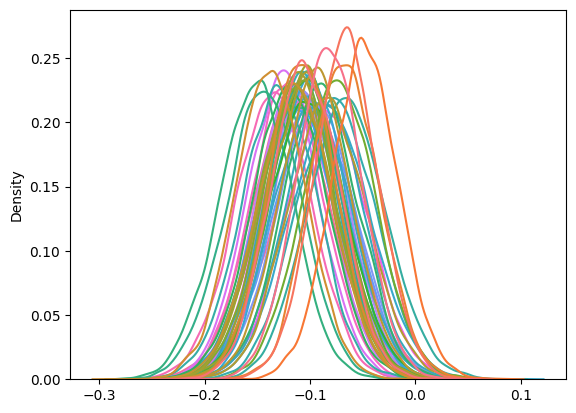

In [15]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,1,:], legend=False)

<AxesSubplot: ylabel='Density'>

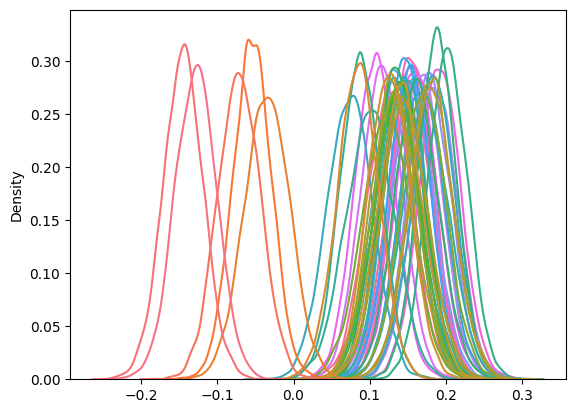

In [16]:
aux_shape = ritorno['inference_data'].posterior.c.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.c.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

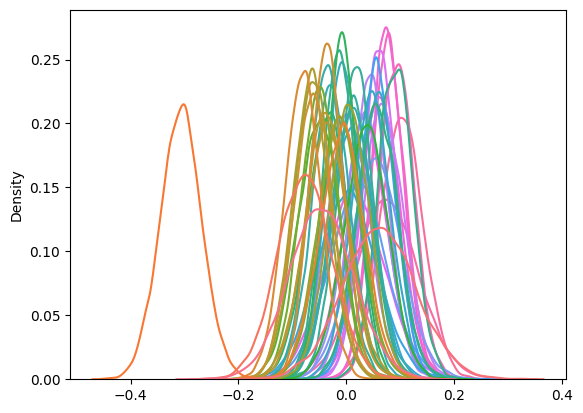

In [17]:
aux_shape = ritorno['inference_data'].posterior.w_s.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.w_s.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

In [18]:
pd.set_option('display.max_columns', 500)
spatial_results = pd.DataFrame(ritorno['inference_data'].posterior.w_s.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
spatial_results.loc['abs_dist_from_mean',:] = (spatial_results.loc['mean',:] - spatial_results.loc['mean',:].mean()).abs()
spatial_results.sort_values('abs_dist_from_mean', axis=1, ascending=False)
#spatial_results.sort_values('mean', axis=1, ascending=True)

,SAVIGNANO DI RIGO,TIMAVO,SAN FRANCESCO,PARCO EDILCARANI,VERUCCHIO,CORTE BRUGNATELLA,CITTADELLA,GERBIDO,MONTEBELLO,MARECCHIA,DE AMICIS,GIARDINI MARGHERITA,S. LAZZARO,GIARDINI,FEBBIO,SAN LAZZARO,S. ROCCO,SAN PIETRO CAPOFIUME,PARCO FERRARI,CASTELLARANO,SARAGAT,CENO,CASTELLUCCIO,PARCO RESISTENZA,PARCO MONTECUCCO,PORTA SAN FELICE,BADIA,PARCO BERTOZZI,ROMA,GIORDANI-FARNESE,ZALAMELLA,REMESINA,LUGAGNANO,FLAMINIA,DELTA CERVIA,FRANCHINI-ANGELONI,PARADIGNA,SAVIGNANO,GAVELLO,SAN LEO,BESENZONE,MALCANTONE,GHERARDI,CENTO,VILLA FULVIA,CAORLE,BOGOLESE,ISONZO,VIA CHIARINI
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,-0.306410,0.102571,0.093294,0.090832,-0.080935,-0.076943,0.077313,0.076855,0.075405,-0.065292,-0.062066,-0.061775,0.069143,0.063326,0.061142,-0.051587,0.060237,-0.049831,0.058399,0.056898,0.056483,0.055782,-0.045742,-0.037341,0.045815,-0.036549,-0.036031,-0.035278,-0.034291,0.042434,-0.028845,0.036386,0.036101,0.034391,-0.012834,-0.012742,0.021605,-0.011015,-0.008718,-0.008249,0.015842,0.015607,-0.005671,0.012018,0.011800,0.009843,0.001343,0.002770,0.004920
std,0.038593,0.039460,0.032450,0.032496,0.034201,0.050646,0.031196,0.057665,0.030105,0.035118,0.034504,0.036763,0.037855,0.036776,0.068578,0.040230,0.031529,0.036093,0.036843,0.037665,0.033729,0.047916,0.060295,0.039012,0.036722,0.033188,0.031056,0.041860,0.039133,0.034448,0.035586,0.039290,0.041153,0.040622,0.031650,0.040524,0.054844,0.039552,0.031315,0.042009,0.033783,0.055393,0.033313,0.041055,0.039079,0.037329,0.055658,0.039286,0.037974
min,-0.451929,-0.028114,-0.021401,-0.032652,-0.211771,-0.268127,-0.041326,-0.134485,-0.035171,-0.202785,-0.214657,-0.215806,-0.076860,-0.097305,-0.210157,-0.213683,-0.079157,-0.217263,-0.085559,-0.080720,-0.071879,-0.109718,-0.285971,-0.185684,-0.090075,-0.176187,-0.161792,-0.205623,-0.196196,-0.096995,-0.153849,-0.122254,-0.132079,-0.120896,-0.129597,-0.178752,-0.196225,-0.161476,-0.128605,-0.172774,-0.119853,-0.230863,-0.130816,-0.169802,-0.148996,-0.121303,-0.242722,-0.166949,-0.148257
25%,-0.332056,0.076158,0.071530,0.068725,-0.103766,-0.111479,0.056758,0.037728,0.055765,-0.088718,-0.085327,-0.085926,0.043638,0.039017,0.014856,-0.078338,0.039341,-0.074185,0.033950,0.031700,0.034359,0.023779,-0.086205,-0.063159,0.021231,-0.058919,-0.057233,-0.062632,-0.060673,0.019139,-0.052461,0.010261,0.009016,0.007730,-0.034144,-0.039517,-0.014436,-0.037891,-0.029307,-0.036153,-0.006299,-0.021360,-0.027651,-0.015379,-0.013569,-0.015560,-0.036027,-0.023254,-0.020344
50%,-0.306119,0.102565,0.093290,0.090919,-0.080592,-0.077135,0.077146,0.075648,0.074875,-0.065298,-0.061733,-0.061719,0.068317,0.062872,0.061203,-0.051260,0.060492,-0.049933,0.058608,0.056537,0.056151,0.055101,-0.046483,-0.037723,0.045985,-0.036443,-0.036442,-0.035396,-0.033986,0.042640,-0.028935,0.035967,0.036768,0.034257,-0.013034,-0.012768,0.021783,-0.011417,-0.008691,-0.007306,0.016452,0.014788,-0.006140,0.011774,0.012006,0.010301,0.001695,0.002734,0.004676
75%,-0.280899,0.128534,0.114788,0.112575,-0.058193,-0.043456,0.097972,0.114672,0.095279,-0.042370,-0.038801,-0.037511,0.094824,0.087648,0.106811,-0.024475,0.081286,-0.025785,0.083098,0.082371,0.078875,0.087060,-0.006075,-0.011370,0.070106,-0.014464,-0.015421,-0.007505,-0.008064,0.065347,-0.004887,0.062472,0.063716,0.061462,0.008292,0.014096,0.056994,0.015043,0.011688,0.019610,0.037919,0.052351,0.016458,0.039743,0.037228,0.034770,0.038052,0.0297

<AxesSubplot: ylabel='Density'>

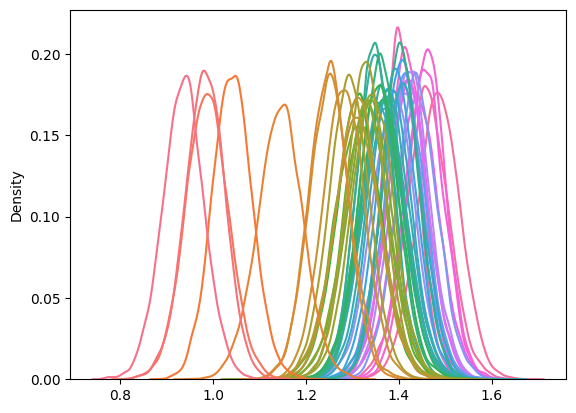

In [19]:
aux_shape = ritorno['inference_data'].posterior.annual_mean.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_mean.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

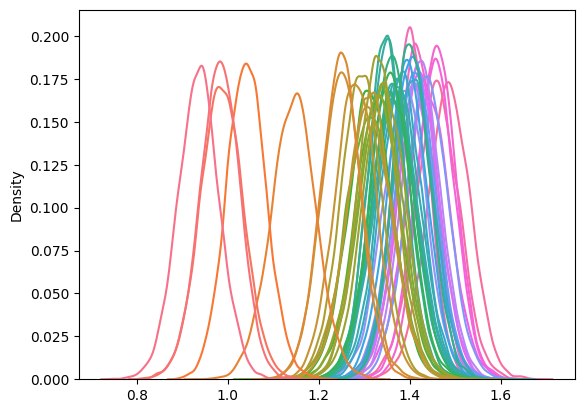

In [20]:
aux_shape = ritorno['inference_data'].posterior.annual_median.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_median.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

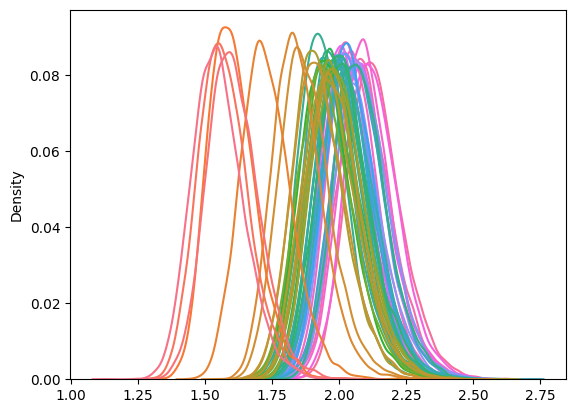

In [21]:
aux_shape = ritorno['inference_data'].posterior.annual_max.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_max.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

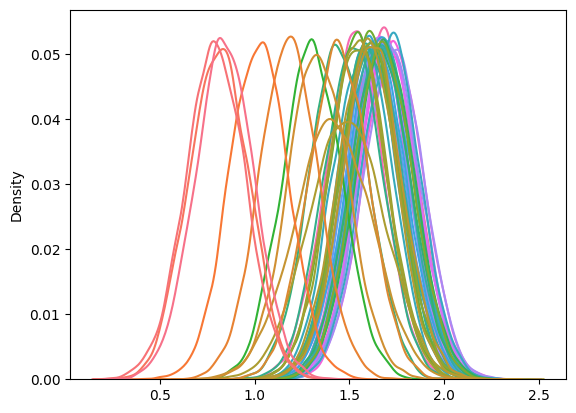

In [22]:
valori_31_dic = []
for dizionario in ritorno['missing']:
    if dizionario['Data'] == '2018-12-31':
        valori_31_dic.append(dizionario['Samples'])
        
res_plot = sns.kdeplot(valori_31_dic, legend=False)

<AxesSubplot: ylabel='Density'>

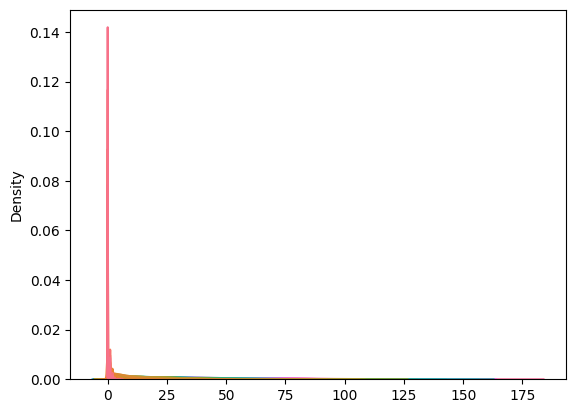

In [23]:
aux_shape = ritorno['inference_data'].posterior.annual_days_over_threshold.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

In [24]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,FEBBIO,SAN LEO,VERUCCHIO,BADIA,GIARDINI MARGHERITA,MARECCHIA,SAN PIETRO CAPOFIUME,LUGAGNANO,DELTA CERVIA,PARCO BERTOZZI,SAN LAZZARO,PARCO RESISTENZA,GHERARDI,FRANCHINI-ANGELONI,VIA CHIARINI,BESENZONE,DE AMICIS,PORTA SAN FELICE,GAVELLO,SAVIGNANO,CAORLE,VILLA FULVIA,CASTELLARANO,ROMA,PARCO MONTECUCCO,CENTO,BOGOLESE,ZALAMELLA,SAN FRANCESCO,MALCANTONE,REMESINA,SARAGAT,PARADIGNA,S. LAZZARO,S. ROCCO,CITTADELLA,PARCO FERRARI,ISONZO,PARCO EDILCARANI,GIORDANI-FARNESE,CENO,FLAMINIA,GERBIDO,MONTEBELLO,GIARDINI,TIMAVO
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.0000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.084700,0.114200,0.169900,0.213200,1.439700,6.163700,8.191700,13.288900,13.383800,17.298200,17.327300,17.440400,18.862400,20.159400,20.947400,21.590300,22.266600,22.494100,23.346300,23.748900,24.173500,24.189900,24.849800,28.25950,28.606600,29.147100,29.159600,29.453100,31.460200,32.663700,33.974300,35.803000,36.122500,37.146600,37.261200,37.404800,37.728800,37.733700,40.380200,43.072200,43.647400,44.093500,45.711600,49.9224,50.438500,54.714200,55.854200,59.622000,67.054000
std,0.336656,0.393921,0.477972,0.547335,1.874117,4.538299,5.566943,7.712067,7.559802,10.245837,9.490173,8.649215,10.746209,10.771044,10.750106,11.560822,11.529198,11.233939,12.010604,10.714884,10.759757,11.385359,11.942408,13.48826,12.895397,11.863336,13.050922,13.064121,14.020609,13.437249,14.321032,12.836957,15.052965,14.834585,14.079631,14.959115,14.947849,15.275121,14.064097,15.689723,15.918468,14.578107,16.045989,17.6247,18.282299,19.285744,17.229673,17.970203,20.824045
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.00000,2.000000,0.000000,1.000000,1.000000,1.000000,0.000000,2.000000,2.000000,2.000000,1.000000,2.000000,2.000000,4.000000,2.000000,6.000000,4.000000,5.000000,4.000000,4.000000,5.0000,6.000000,6.000000,9.000000,9.000000,14.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,4.000000,8.000000,8.000000,10.000000,10.000000,11.000000,11.000000,12.000000,13.000000,13.000000,14.000000,14.000000,15.000000,16.000000,16.000000,16.000000,16.000000,18.00000,19.000000,21.000000,20.000000,20.000000,21.000000,23.000000,24.000000,26.000000,25.000000,27.000000,27.000000,27.000000,27.000000,27.000000,30.000000,32.000000,32.000000,34.000000,35.000000,37.0000,38.000000,41.000000,43.000000,47.000000,52.000000
50%,0.000000,0.000000,0.000000,0.000000,1.000000,5.000000,7.000000,12.000000,12.000000,15.000000,16.000000,16.000000,17.000000,18.000000,19.000000,20.000000,20.000000,21.000000,22.000000,22.000000,23.000000,23.000000,23.000000,26.00000,27.000000,28.000000,27.000000,28.000000,30.000000,31.000000,32.000000,35.000000,34.000000,35.000000,36.000000,36.000000,36.000000,36.000000,39.000000,41.000000,42.000000,43.000000,44.000000,48.0000,49.000000,53.000000,54.000000,58.000000,65.000000
75%,0.000000,0.000000,0.000000,0.000000,2.000000,8.000000,11.000000,17.000000,17.000000,23.000000,23.000000,22.000000,25.000000,26.000000,27.000000,28.000000,29.000000,29.000000,30.000000,30.000000,30.000000,31.000000,32.000000,35.25000,36.000000,36.000000,37.000000,37.000000,39.000000,41.000000,42.000000,44.000000,45.000000,46.000000,46.000000,46.000000,46.000000,47.000000,49.000000,53.000000,53.000000,53.000000,55.0000

In [25]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_daily_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,FEBBIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,SAN LEO,VERUCCHIO,BADIA,MARECCHIA,GIARDINI MARGHERITA,DELTA CERVIA,LUGAGNANO,SAN PIETRO CAPOFIUME,PARCO BERTOZZI,SAN LAZZARO,PARCO RESISTENZA,GHERARDI,FRANCHINI-ANGELONI,VIA CHIARINI,DE AMICIS,PORTA SAN FELICE,BESENZONE,GAVELLO,SAVIGNANO,CAORLE,VILLA FULVIA,CASTELLARANO,ROMA,PARCO MONTECUCCO,CENTO,BOGOLESE,ZALAMELLA,MALCANTONE,SAN FRANCESCO,REMESINA,SARAGAT,PARADIGNA,S. LAZZARO,S. ROCCO,CITTADELLA,PARCO FERRARI,ISONZO,PARCO EDILCARANI,GIORDANI-FARNESE,FLAMINIA,CENO,GERBIDO,MONTEBELLO,GIARDINI,TIMAVO
count,10000.0,10000.0,10000.0,10000.0,10000.0,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.00000,10000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.000300,0.001200,0.012800,0.013900,0.037000,0.047100,0.055100,0.076000,0.088900,0.097300,0.114800,0.122900,0.125400,0.135300,0.141800,0.147800,0.149200,0.168800,0.250000,0.259400,0.267000,0.276000,0.28100,0.336400,0.371300,0.407700,0.467200,0.474200,0.498600,0.505300,0.508500,0.512200,0.512800,0.603700,0.660700,0.67090,0.703400,0.724600,0.788600,0.790400,0.842800,0.89440,0.92440,0.950400
std,0.0,0.0,0.0,0.0,0.0,0.017319,0.034622,0.112416,0.117082,0.188771,0.211863,0.228187,0.265011,0.284614,0.296381,0.318796,0.328339,0.331188,0.342061,0.348862,0.354919,0.356303,0.374594,0.433034,0.438327,0.442414,0.447039,0.44951,0.472501,0.483177,0.491431,0.498948,0.499359,0.500023,0.499997,0.499953,0.499876,0.499861,0.489153,0.473495,0.46991,0.456781,0.446738,0.408322,0.407043,0.364007,0.30734,0.26437,0.217128
min,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000
25%,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,1.000000,1.000000,1.00000,1.00000,1.000000
50%,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.00000,1.000000
75%,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.00000,1.000000
max,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000

<AxesSubplot: >

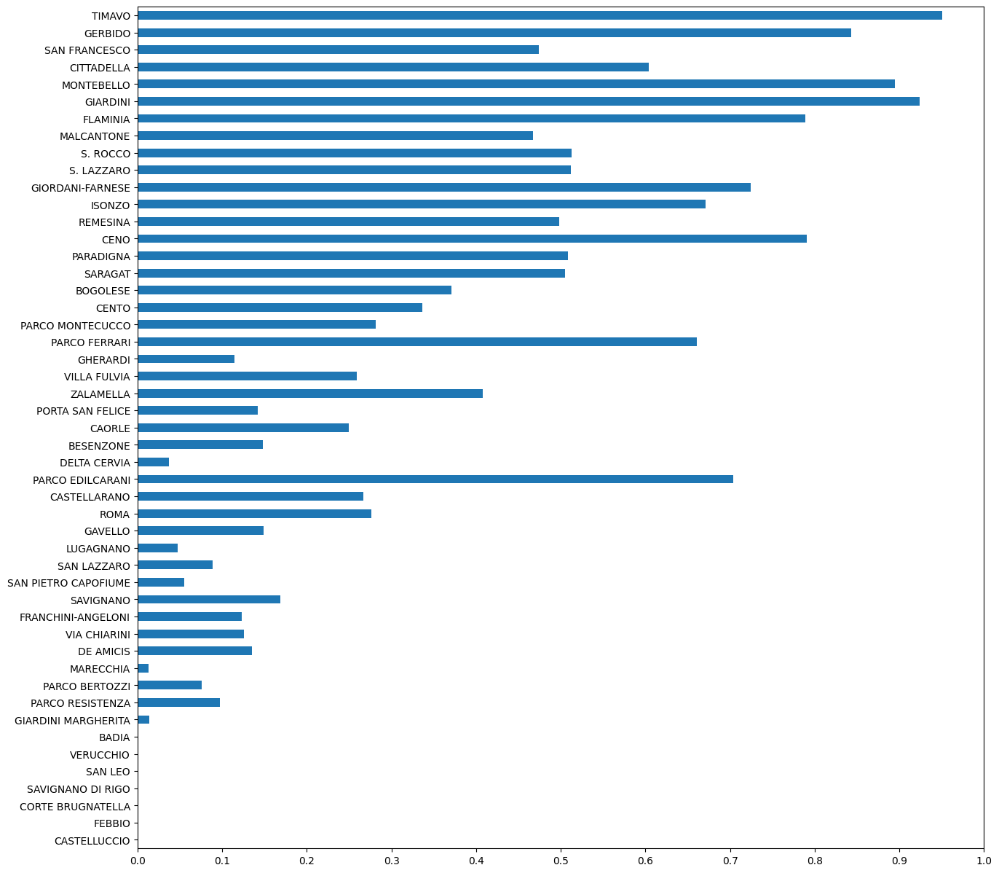

In [26]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [27]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_annual_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,PARCO EDILCARANI,DELTA CERVIA,BESENZONE,PORTA SAN FELICE,VILLA FULVIA,GHERARDI,PARCO MONTECUCCO,BOGOLESE,SARAGAT,PARADIGNA,REMESINA,ISONZO,GIORDANI-FARNESE,CITTADELLA,SAN FRANCESCO,CASTELLARANO,ROMA,CAORLE,LUGAGNANO,FEBBIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,SAN LEO,VERUCCHIO,BADIA,GAVELLO,PARCO RESISTENZA,PARCO BERTOZZI,GIARDINI MARGHERITA,MARECCHIA,SAN LAZZARO,DE AMICIS,SAN PIETRO CAPOFIUME,VIA CHIARINI,FRANCHINI-ANGELONI,SAVIGNANO,MALCANTONE,S. ROCCO,S. LAZZARO,ZALAMELLA,CENTO,PARCO FERRARI,GIARDINI,MONTEBELLO,CENO,FLAMINIA,GERBIDO,TIMAVO
count,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0000,10000.0000,10000.0000,10000.0000,10000.0000,10000.0000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,0.000400,0.000400,0.000600,0.000600,0.001500,0.007400
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0100,0.0100,0.0100,0.0100,0.0100,0.0100,0.019997,0.019997,0.024489,0.024489,0.038703,0.085709
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


<AxesSubplot: >

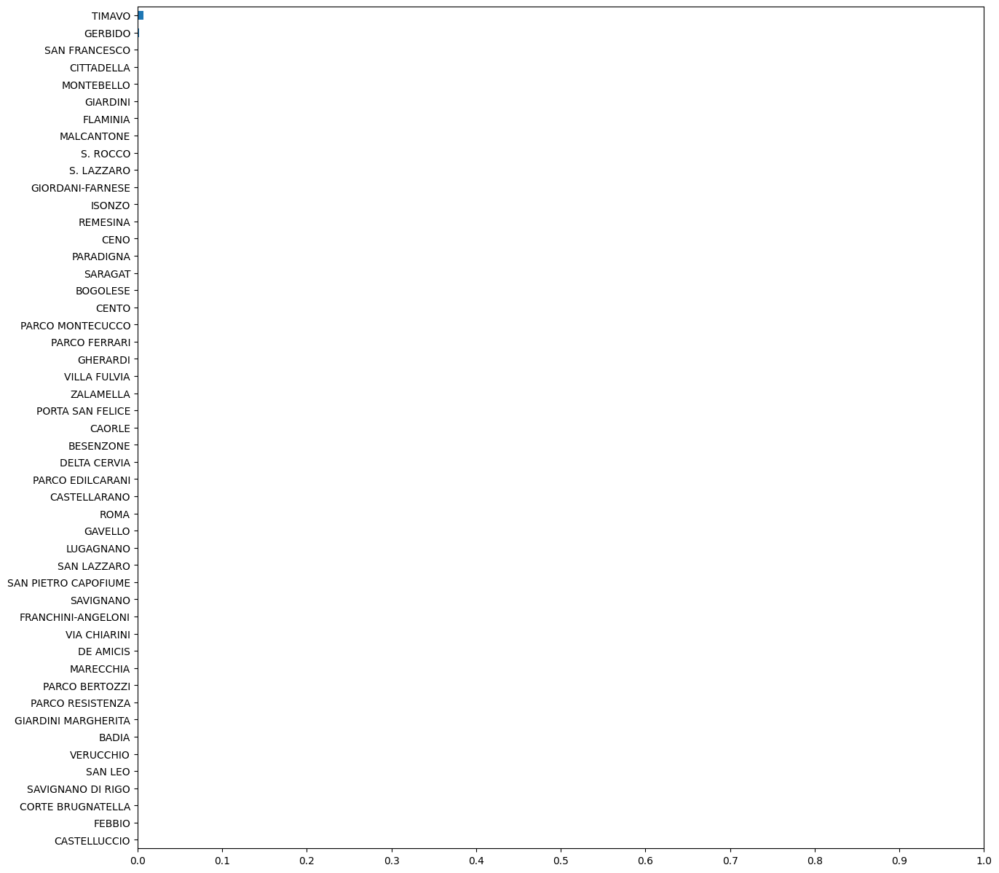

In [28]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [29]:
y_post_pred = ritorno['inference_data'].posterior.y_post_pred.to_numpy()
y_post_pred = y_post_pred.reshape(y_post_pred.shape[0]*y_post_pred.shape[1], y_post_pred.shape[2], y_post_pred.shape[3])
y_post_pred.shape

(10000, 365, 49)

In [30]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
from IPython.display import display

In [31]:
@widgets.interact(stazione = df.columns)
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

interactive(children=(Dropdown(description='stazione', options=('CASTELLUCCIO', 'FEBBIO', 'CORTE BRUGNATELLA',…

In [32]:
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

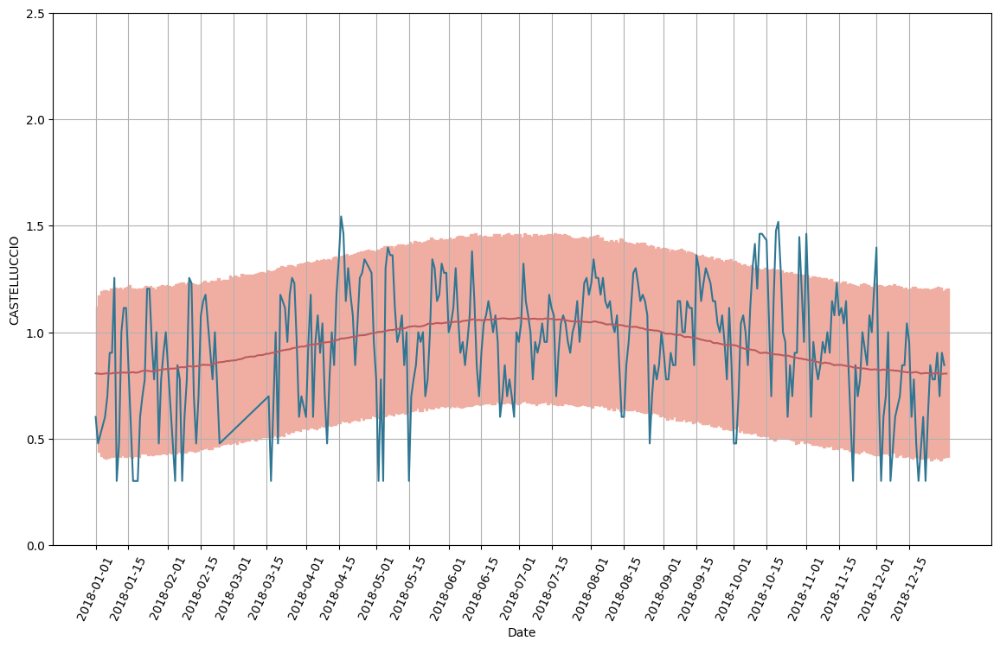

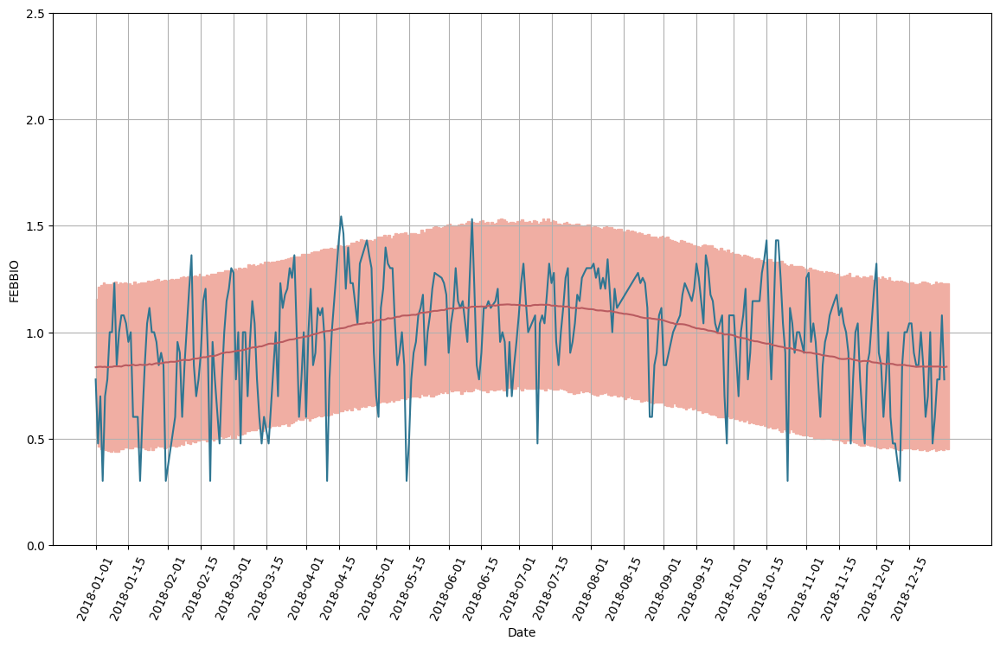

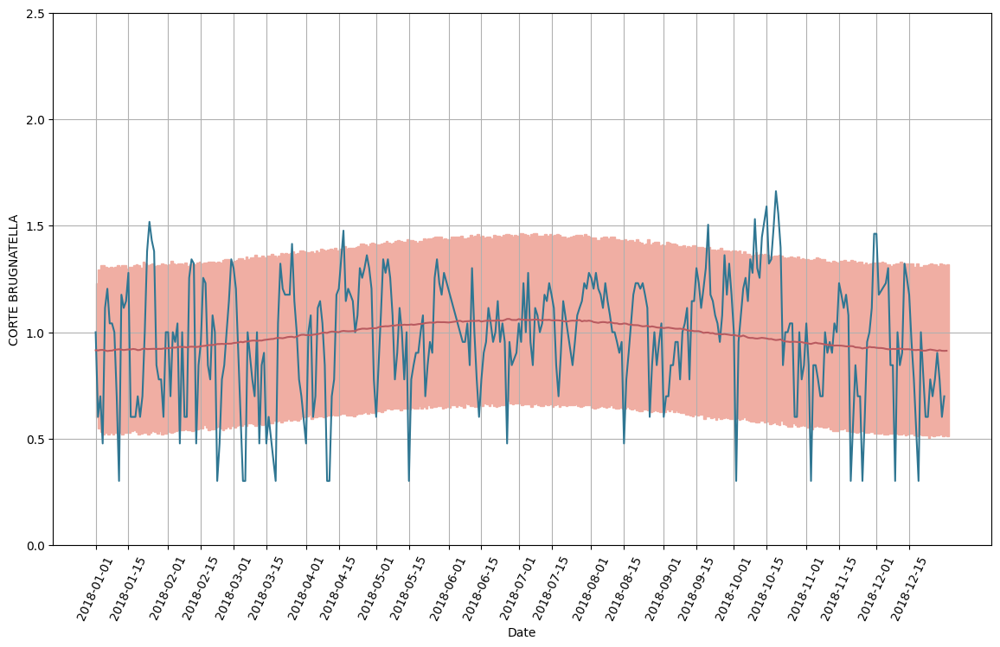

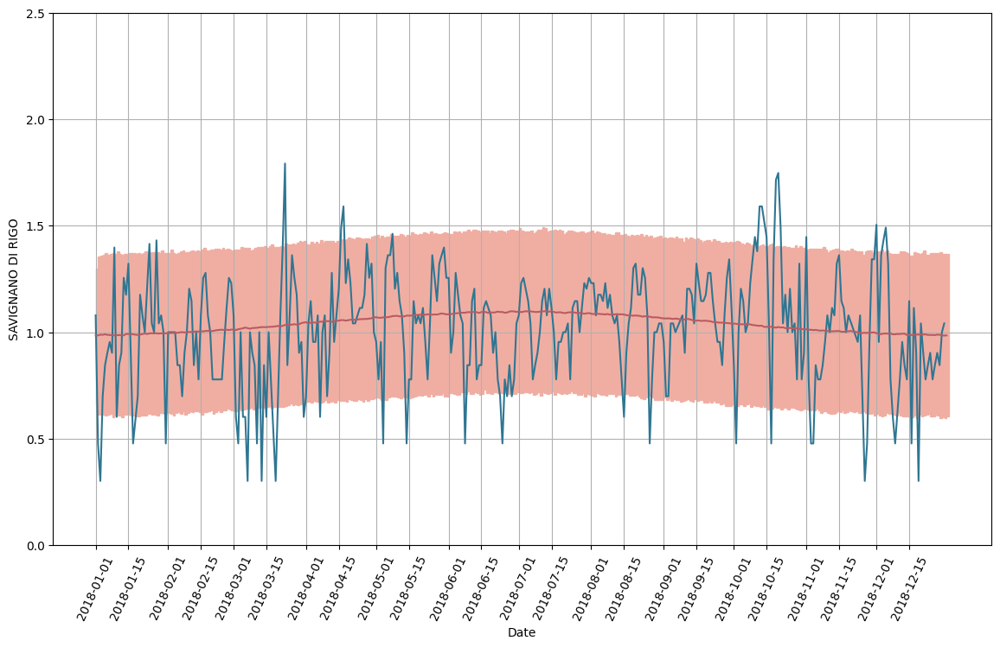

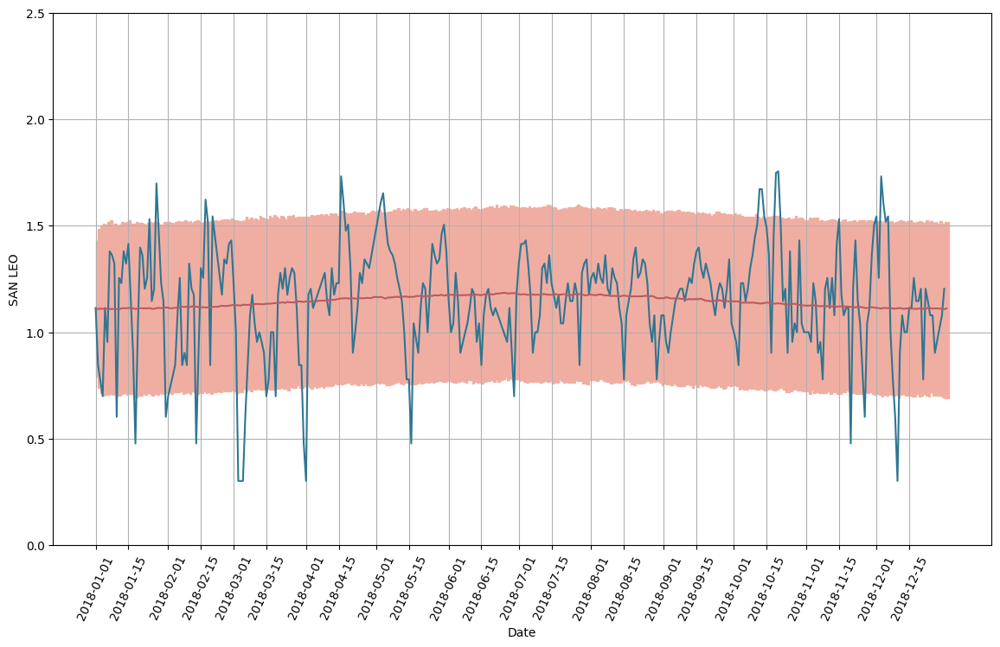

...

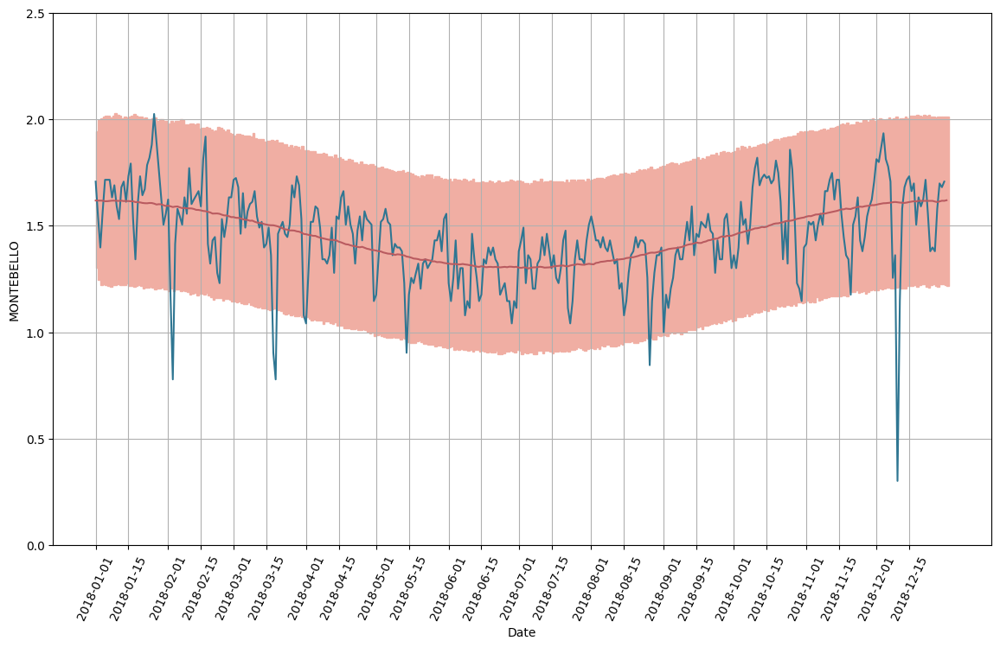

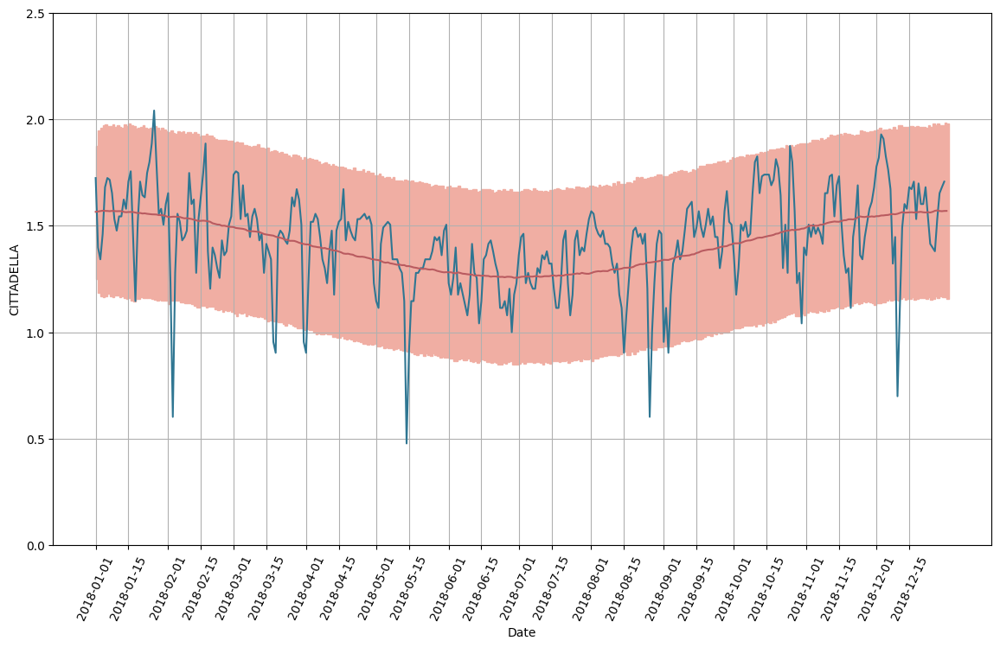

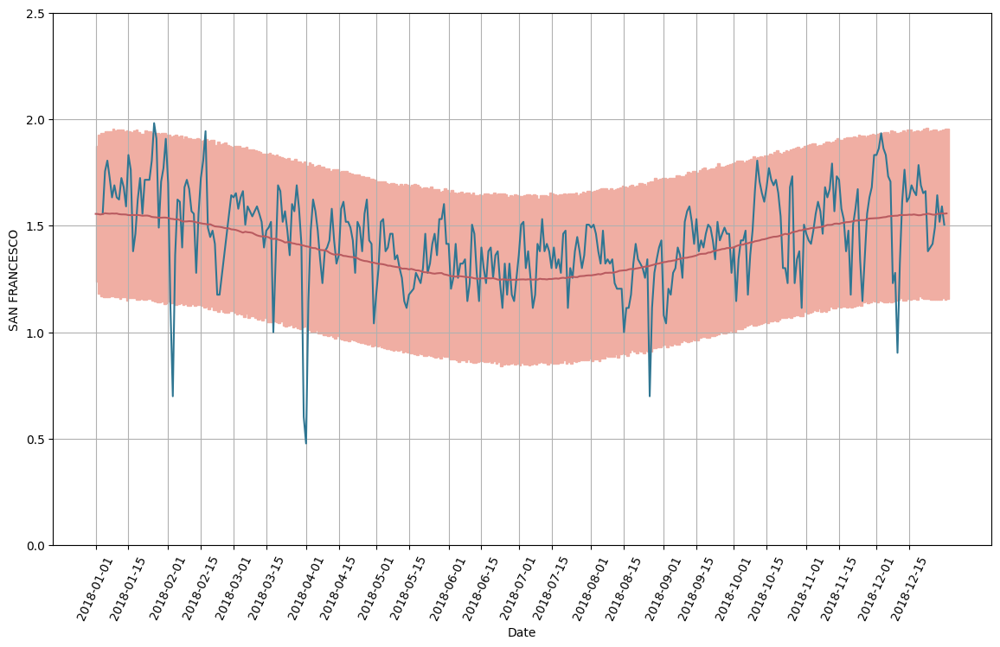

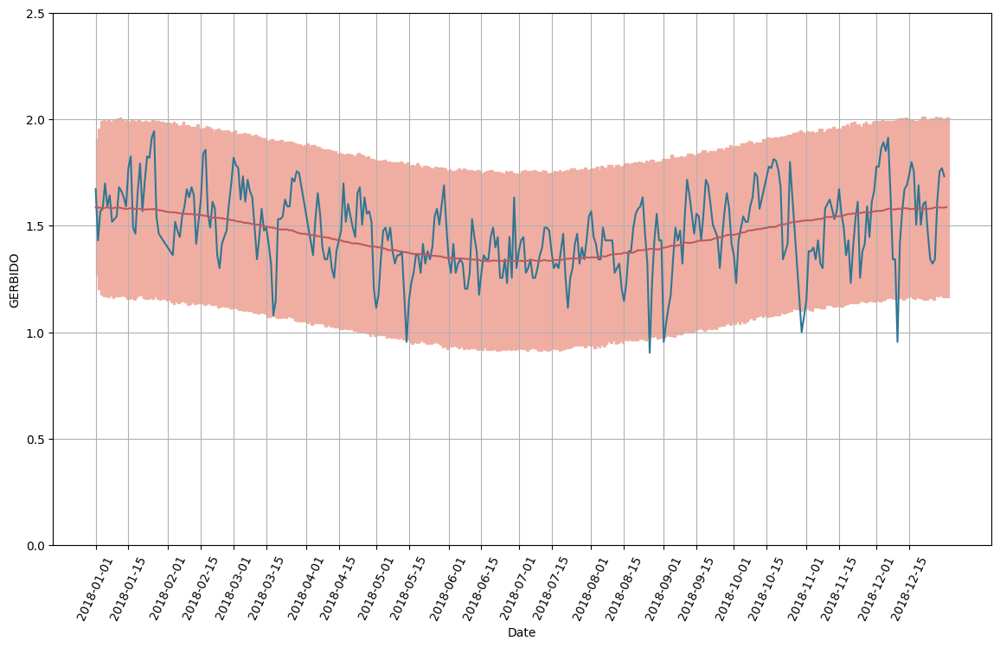

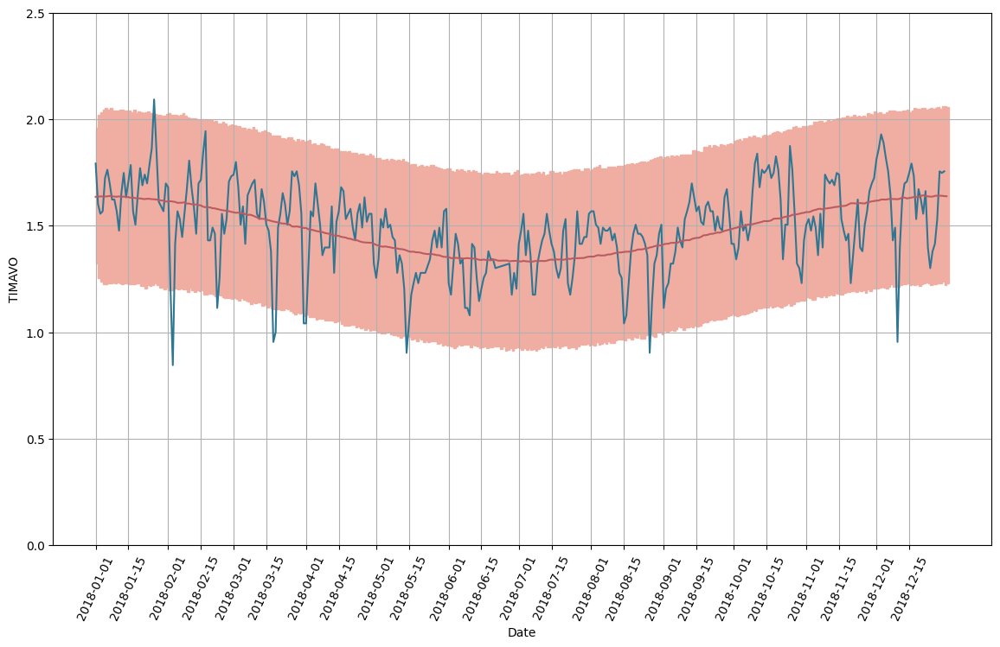

In [33]:
for stazione in df.columns:
    f(stazione)